##Note on Reproducibility and Runtime

This notebook is designed to run in ***Google Colab (T4 GPU recommended).***

Reproducing the submitted results without retraining

To reproduce the reported VGG16 results directly, upload the following files to /content/ in Colab:

**best_vgg16_reproduced.pth**

**to_label_points_based.zip**

**New_Images_outdoor_full.zip**

**IMD.zip**

**final_ground_truth.csv**

**download_log.csv**

Then run all cells from top to bottom.
The notebook will unzip the files, load the submitted VGG16 checkpoint, and reproduce the evaluation and full-prediction pipeline without retraining.

Retraining from scratch

To retrain the models from scratch, do not upload best_vgg16_reproduced.pth.zip.
If the checkpoint is not found, the notebook will train the models and save the best VGG16 checkpoint for later evaluation.

Data access

All required files are provided in the shared folder:
(https://liveuclac-my.sharepoint.com/:f:/g/personal/ucfayz6_ucl_ac_uk/IgDbz3sTGUUBR7rC49asZRFdAZ6XnguTdlvbsVf_xAjh_4E?e=lo2oQZ)]

# unzip the file and Check Data

In [ ]:
#unzip the files
from pathlib import Path
import zipfile
import pandas as pd

CONTENT_ROOT = Path("/content")

# Unzip all zip files
zip_jobs = {
    "to_label_points_based.zip": CONTENT_ROOT / "to_label_points_based",
    "New_Images_outdoor_full.zip": CONTENT_ROOT / "New_Images_outdoor_full",
    "IMD.zip": CONTENT_ROOT / "IMD",
}

print("=" * 60)
print("UNZIP CHECK")
print("=" * 60)

for zip_name, out_dir in zip_jobs.items():
    zip_path = CONTENT_ROOT / zip_name

    if zip_path.exists():
        out_dir.mkdir(parents=True, exist_ok=True)
        with zipfile.ZipFile(zip_path, "r") as zf:
            zf.extractall(out_dir)
        print(f"[OK] Unzipped: {zip_path.name} -> {out_dir}")
    else:
        print(f"[MISSING] {zip_path}")

# Configure paths
GROUND_TRUTH_CSV = CONTENT_ROOT / "final_ground_truth.csv"
GROUND_TRUTH_IMG_DIR = CONTENT_ROOT / "to_label_points_based/to_label_points_based"
FULL_LOG_CSV = CONTENT_ROOT / "download_log.csv"
FULL_IMG_DIR_PATH = CONTENT_ROOT / "New_Images_outdoor_full/New_Images_outdoor_full"


# Check all paths
paths = {
    "GROUND_TRUTH_CSV": GROUND_TRUTH_CSV,
    "GROUND_TRUTH_IMG_DIR": GROUND_TRUTH_IMG_DIR,

    "FULL_LOG_CSV": FULL_LOG_CSV,
    "FULL_IMG_DIR_PATH": FULL_IMG_DIR_PATH,
}

print("\n" + "=" * 60)
print("PATH CHECK")
print("=" * 60)

for name, path in paths.items():
    if path.exists():
        if path.is_dir():
            print(f"[OK] {name}: DIRECTORY exists")
        else:
            print(f"[OK] {name}: FILE exists")
    else:
        print(f"[MISSING] {name}: not found")
    print(f"    -> {path}")

# Load ground truth CSV
if GROUND_TRUTH_CSV.exists():
    df = pd.read_csv(GROUND_TRUTH_CSV)
    print("\n" + "=" * 60)
    print("GROUND TRUTH CSV CHECK")
    print("=" * 60)
    print(df.head())
    print(df.columns.tolist())
    print(df["label"].value_counts(dropna=False))
    print("Rows:", len(df))
else:
    print("\nGROUND_TRUTH_CSV not found, so df was not created.")

UNZIP CHECK
[OK] Unzipped: to_label_points_based.zip -> /content/to_label_points_based
[OK] Unzipped: New_Images_outdoor_full.zip -> /content/New_Images_outdoor_full
[OK] Unzipped: IMD.zip -> /content/IMD

PATH CHECK
[OK] GROUND_TRUTH_CSV: FILE exists
    -> /content/final_ground_truth.csv
[OK] GROUND_TRUTH_IMG_DIR: DIRECTORY exists
    -> /content/to_label_points_based/to_label_points_based
[OK] FULL_LOG_CSV: FILE exists
    -> /content/download_log.csv
[OK] FULL_IMG_DIR_PATH: DIRECTORY exists
    -> /content/New_Images_outdoor_full/New_Images_outdoor_full

GROUND TRUTH CSV CHECK
  point_id          filename       lon        lat  heading  label capture_date
0  pt_0031    pt_0031_h0.jpg -0.236210  51.443976        0      0       25-May
1  pt_0031   pt_0031_h90.jpg -0.236210  51.443976       90      0       25-May
2  pt_0031  pt_0031_h180.jpg -0.236210  51.443976      180      0       25-May
3  pt_0031  pt_0031_h270.jpg -0.236210  51.443976      270      0       25-May
4  pt_0033    pt_

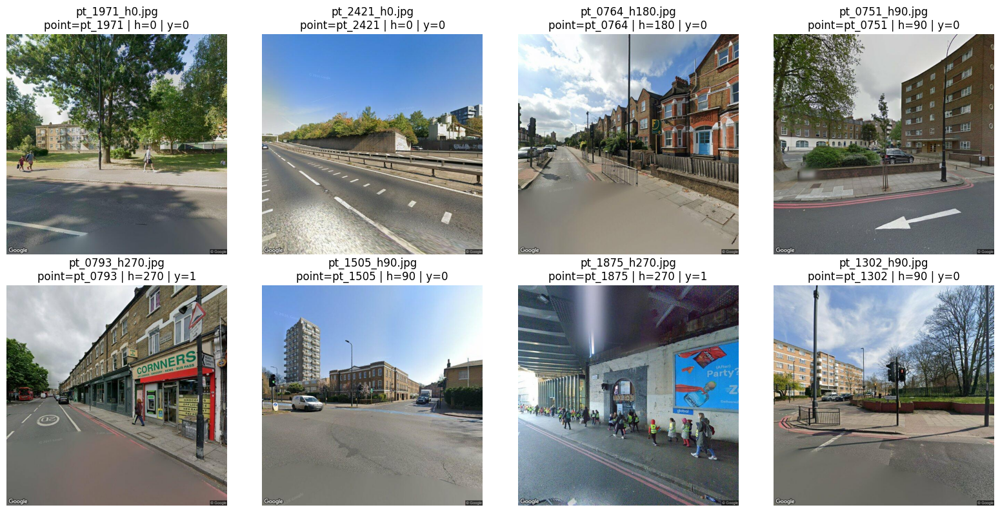

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import random
import os

IMG_DIR = str(GROUND_TRUTH_IMG_DIR)

sample_rows = df.sample(8, random_state=42).reset_index(drop=True)

plt.figure(figsize=(16, 8))
for i in range(len(sample_rows)):
    row = sample_rows.loc[i]
    img_path = os.path.join(IMG_DIR, row['filename'])
    img = Image.open(img_path).convert('RGB')

    plt.subplot(2, 4, i + 1)
    plt.imshow(img)
    plt.title(f"{row['filename']}\npoint={row['point_id']} | h={row['heading']} | y={row['label']}")
    plt.axis('off')

plt.tight_layout()
plt.show()

#3. Image classification

In [ ]:
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GroupShuffleSplit

from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.models as models
import torchvision.transforms as transforms

import matplotlib.pyplot as plt
import os

# check GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

Using device: cuda


In [ ]:
# Fix random seeds for reproducibility
import random

random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
torch.cuda.manual_seed(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
print('Random seeds fixed.')

Random seeds fixed.


In [ ]:
# Hyperparameters
BATCH_SIZE    = 32    # Number of images processed per training step
NUM_EPOCHS    = 15    # Number of full passes through the training data
LEARNING_RATE = 1e-4  # Step size for gradient descent (Adam optimiser)
RANDOM_STATE  = 42    # Seed for reproducibility of train/test split

## 4. Load Data & Train/Test Split

We split the data at the point level to prevent data leakage (images from the same point appearing in both training and test sets). Points are first split 80/20 into train+val and test sets, then the train+val set is further split 80/20 into training and validation sets, giving approximately 64%/16%/20% train/val/test. All splits use stratify to preserve the observed point-level class balance reported in the output below.

In [ ]:
from sklearn.model_selection import train_test_split

# Point-level label: if any of the 4 images at a point is billboard, mark the point as positive
point_labels = df.groupby('point_id', as_index=False)['label'].max()

# Split points into train / val / test
train_val_points, test_points = train_test_split(
    point_labels,
    test_size=0.2,
    random_state=42,
    stratify=point_labels['label']
)

train_points, val_points = train_test_split(
    train_val_points,
    test_size=0.2,   # 0.2 of 0.8 = 0.16 total
    random_state=42,
    stratify=train_val_points['label']
)

# Map point split back to image-level dataframe
train_df = df[df['point_id'].isin(train_points['point_id'])].reset_index(drop=True)
val_df   = df[df['point_id'].isin(val_points['point_id'])].reset_index(drop=True)
test_df  = df[df['point_id'].isin(test_points['point_id'])].reset_index(drop=True)

print(f"Train images: {len(train_df)}, points: {train_df['point_id'].nunique()}")
print(f"Val images:   {len(val_df)}, points: {val_df['point_id'].nunique()}")
print(f"Test images:  {len(test_df)}, points: {test_df['point_id'].nunique()}")

print("\nPoint label distribution:")
print("Train:", train_points['label'].value_counts(normalize=True).to_dict())
print("Val:  ", val_points['label'].value_counts(normalize=True).to_dict())
print("Test: ", test_points['label'].value_counts(normalize=True).to_dict())

Train images: 960, points: 240
Val images:   240, points: 60
Test images:  300, points: 75

Point label distribution:
Train: {1: 0.5416666666666666, 0: 0.4583333333333333}
Val:   {1: 0.55, 0: 0.45}
Test:  {1: 0.5466666666666666, 0: 0.4533333333333333}


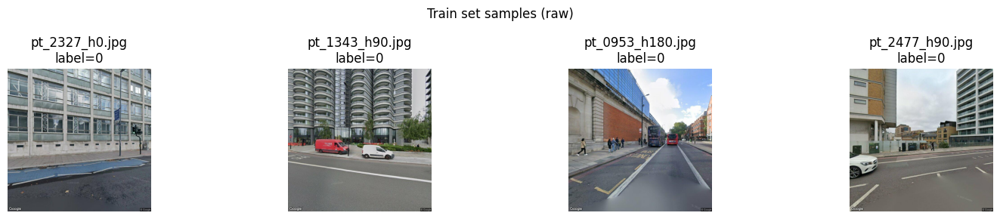

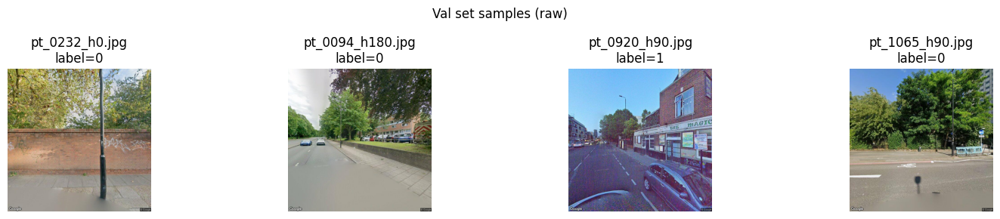

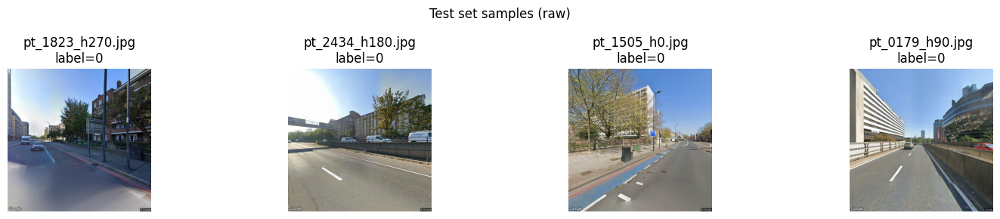

In [ ]:
# Visualise raw images from train/test/Val split
def show_sample_images(df_subset, img_dir, n=8, title="Sample images"):
    sample_df = df_subset.sample(n=min(n, len(df_subset)), random_state=42).reset_index(drop=True)
    plt.figure(figsize=(15, 5))
    for i in range(len(sample_df)):
        img_path = os.path.join(img_dir, sample_df.loc[i, "filename"])
        img = Image.open(img_path).convert("RGB")
        plt.subplot(2, 4, i + 1)
        plt.imshow(img)
        plt.title(f'{sample_df.loc[i, "filename"]}\nlabel={sample_df.loc[i, "label"]}')
        plt.axis("off")
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

show_sample_images(train_df, IMG_DIR, n=4, title="Train set samples (raw)")
show_sample_images(val_df,   IMG_DIR, n=4, title="Val set samples (raw)")
show_sample_images(test_df,  IMG_DIR, n=4, title="Test set samples (raw)")


## 4. Data Augmentation & Preprocessing

All images are resized to 224×224 pixels and normalised using ImageNet statistics (mean and standard deviation), as the pretrained backbone was originally trained on ImageNet.

Training images also receive random augmentations — horizontal flipping and slight colour jitter — to artificially increase the variety of training examples and reduce overfitting. These augmentations are appropriate for street-view imagery since a billboard remains a billboard regardless of minor lighting variation or left/right orientation.

Validation and test images are only resized and normalised, with no augmentation applied, to ensure that model evaluation reflects real-world inference conditions.

In [ ]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

### 5. Custom Dataset & DataLoader

We define a custom `BillboardDataset` class that reads each image from disk on demand and applies the corresponding transforms. This is more memory-efficient than loading all labelled images into memory at once.

A `DataLoader` wraps each dataset to handle batching and shuffling automatically. The training loader shuffles the data in each epoch to reduce order effects during learning. The validation and test loaders do not shuffle, ensuring that model evaluation remains consistent and reproducible.

In [ ]:
class BillboardDataset(Dataset):
    def __init__(self, dataframe, img_dir, transform=None):
        self.df = dataframe
        self.img_dir = img_dir
        self.transform = transform
    def __len__(self):
        return len(self.df)
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.img_dir, row['filename'])
        image = Image.open(img_path).convert('RGB')
        label = int(row['label'])
        if self.transform:
            image = self.transform(image)
        return image, label

train_dataset = BillboardDataset(train_df, IMG_DIR, transform=train_transforms)
val_dataset   = BillboardDataset(val_df,   IMG_DIR, transform=test_transforms)
test_dataset  = BillboardDataset(test_df,  IMG_DIR, transform=test_transforms)

#  SEED
def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

g = torch.Generator()
g.manual_seed(42)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=0, worker_init_fn=seed_worker, generator=g)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=0)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=0)

print(f'Train: {len(train_dataset)} imgs, {len(train_loader)} batches')
print(f'Val:   {len(val_dataset)} imgs, {len(val_loader)} batches')
print(f'Test:  {len(test_dataset)} imgs, {len(test_loader)} batches')

Train: 960 imgs, 30 batches
Val:   240 imgs, 8 batches
Test:  300 imgs, 10 batches


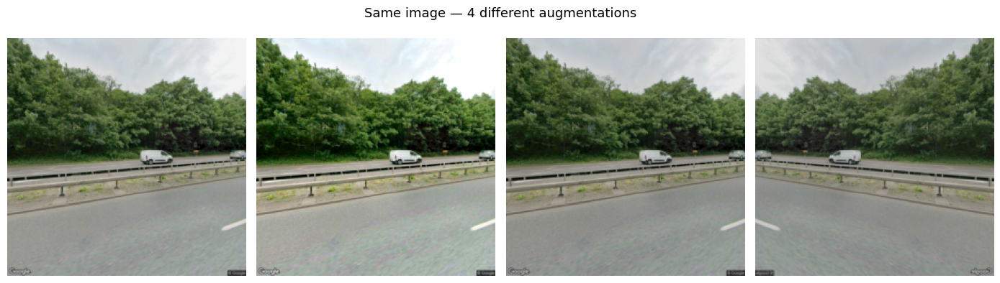

In [ ]:

# Define denormalise function
def denormalise(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std  = torch.tensor(IMAGENET_STD).view(3, 1, 1)
    return (tensor * std + mean).clamp(0, 1)

# check the augmented results
fig, axes = plt.subplots(1, 4, figsize=(14, 4))
sample_img_path = os.path.join(IMG_DIR, train_df.iloc[0]['filename'])
raw_img = Image.open(sample_img_path).convert('RGB')

for ax in axes:
    augmented = train_transforms(raw_img)
    img_display = denormalise(augmented).permute(1, 2, 0).numpy()
    ax.imshow(img_display)
    ax.axis('off')

plt.suptitle('Same image — 4 different augmentations', fontsize=13)
plt.tight_layout()
plt.show()

### ResNet18

For ResNet18, we used the pretrained `torchvision` model with default ImageNet weights and replaced the final fully connected layer with a two-class output (`Billboard` / `No Billboard`).

To address class imbalance, we applied weighted cross-entropy loss so that billboard images received a higher penalty when misclassified. The model was trained using the Adam optimiser with a `ReduceLROnPlateau` learning-rate scheduler.

At each epoch, we recorded training accuracy, validation loss, and validation accuracy. The checkpoint with the best validation accuracy was saved as `best_resnet_model.pth`.

After training, the best checkpoint was reloaded and evaluated on the independent test set.

In [ ]:
# Build Model
model = models.resnet18(weights='DEFAULT')   # Load ImageNet pretrained weights

# Replace the final classification head: 1000 classes -> 2 classes
model.fc = nn.Linear(model.fc.in_features, 2)

model = model.to(device)
print(f'Final layer: {model.fc}')
print(f'Model running on: {device}')

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 185MB/s]


Final layer: Linear(in_features=512, out_features=2, bias=True)
Model running on: cuda


### Handle Class Imbalance

The training set is imbalanced, with substantially more negative than positive samples. To address this, we use a weighted loss so that misclassification of the minority class (`Billboard`) is penalised more heavily. This helps prevent the model from simply predicting `No Billboard` for most images.

In [ ]:
n_neg = (train_df['label'] == 0).sum()
n_pos = (train_df['label'] == 1).sum()
weight_for_pos = n_neg / n_pos
class_weights = torch.tensor([1.0, weight_for_pos], dtype=torch.float).to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.5)

print(f'Negative class weight: 1.00')
print(f'Positive class weight: {weight_for_pos:.2f}')

Negative class weight: 1.00
Positive class weight: 2.93


In [ ]:
train_losses, val_losses, val_accs = [], [], []
best_val_acc = 0.0
best_model_path = r'best_resnet_model.pth'

for epoch in range(NUM_EPOCHS):
    #  Training
    model.train()
    running_loss = 0.0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    avg_train_loss = running_loss / len(train_loader)

    #  Train Accuracy
    model.eval()
    train_correct, train_total = 0, 0

    with torch.no_grad():
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            preds = outputs.argmax(dim=1)
            train_correct += (preds == labels).sum().item()
            train_total += labels.size(0)

    train_acc = train_correct / train_total

    #  Validation
    val_correct, val_total, val_loss = 0, 0, 0.0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            val_loss += criterion(outputs, labels).item()
            preds = outputs.argmax(dim=1)
            val_correct += (preds == labels).sum().item()
            val_total += labels.size(0)

    avg_val_loss = val_loss / len(val_loader)
    val_acc = val_correct / val_total

    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)
    val_accs.append(val_acc)

    scheduler.step(avg_val_loss)

    #  Save best model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), best_model_path)
        print(f'  -> Best model saved (Val Acc: {val_acc*100:.1f}%)')

    print(f'Epoch {epoch+1}')
    print('-------------------------------')
    print(f'Train set: Accuracy: {train_acc*100:.1f}%  Avg loss: {avg_train_loss:.4f}')
    print(f'Val set:   Accuracy: {val_acc*100:.1f}%  Avg loss: {avg_val_loss:.4f}')
    print()

print('Training complete!')
best_epoch = val_accs.index(best_val_acc) + 1
print(f'Best epoch: {best_epoch} / {NUM_EPOCHS}')
print(f'Best Val Accuracy: {best_val_acc*100:.1f}%')

# ── Load best model selected by validation ──
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.eval()
print(f'Best model loaded from: {best_model_path}')

  -> Best model saved (Val Acc: 65.0%)
Epoch 1
-------------------------------
Train set: Accuracy: 78.6%  Avg loss: 0.5633
Val set:   Accuracy: 65.0%  Avg loss: 0.5854

  -> Best model saved (Val Acc: 76.2%)
Epoch 2
-------------------------------
Train set: Accuracy: 95.7%  Avg loss: 0.2944
Val set:   Accuracy: 76.2%  Avg loss: 0.7497

Epoch 3
-------------------------------
Train set: Accuracy: 98.0%  Avg loss: 0.1632
Val set:   Accuracy: 70.8%  Avg loss: 0.6934

  -> Best model saved (Val Acc: 77.5%)
Epoch 4
-------------------------------
Train set: Accuracy: 98.2%  Avg loss: 0.0993
Val set:   Accuracy: 77.5%  Avg loss: 0.6292

  -> Best model saved (Val Acc: 78.3%)
Epoch 5
-------------------------------
Train set: Accuracy: 99.7%  Avg loss: 0.0569
Val set:   Accuracy: 78.3%  Avg loss: 1.2006

Epoch 6
-------------------------------
Train set: Accuracy: 99.9%  Avg loss: 0.0309
Val set:   Accuracy: 75.0%  Avg loss: 0.6905

Epoch 7
-------------------------------
Train set: Accurac

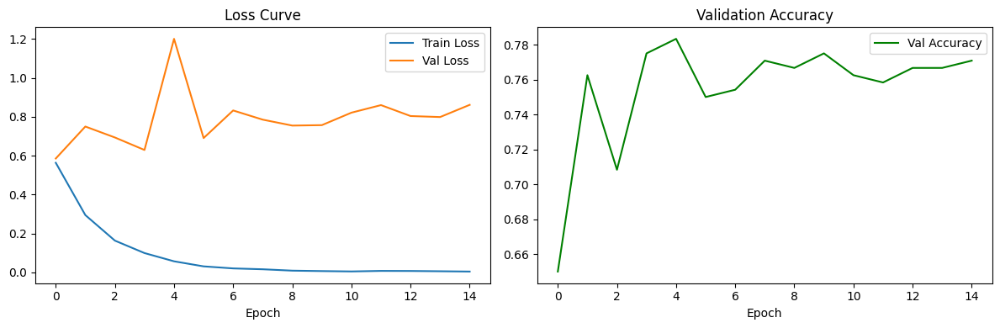

In [ ]:
## 9. Plot Training Curves

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].plot(train_losses, label='Train Loss')
axes[0].plot(val_losses, label='Val Loss')
axes[0].set_title('Loss Curve')
axes[0].set_xlabel('Epoch')
axes[0].legend()

axes[1].plot(val_accs, color='green', label='Val Accuracy')
axes[1].set_title('Validation Accuracy')
axes[1].set_xlabel('Epoch')
axes[1].legend()

plt.tight_layout()
plt.savefig('training_curve_resnet18.png', dpi=150)
plt.show()

Best epoch (based on validation): 5
Best validation accuracy: 78.3%
Test accuracy: 80.0%
Test Set Classification Report
                  precision    recall  f1-score   support

No Billboard (0)       0.82      0.94      0.87       218
   Billboard (1)       0.72      0.44      0.55        82

        accuracy                           0.80       300
       macro avg       0.77      0.69      0.71       300
    weighted avg       0.79      0.80      0.78       300



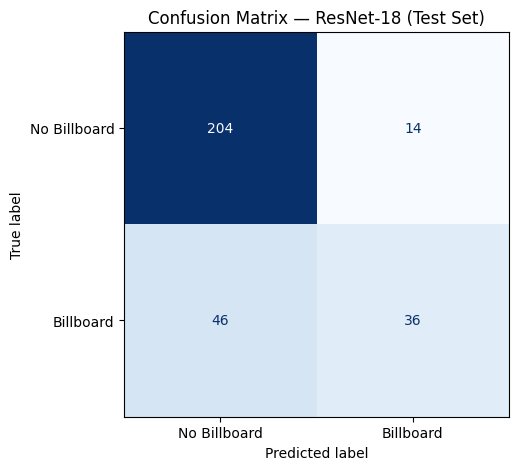

In [ ]:
## 10. Evaluation

# Load best model selected by validation
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.eval()

best_epoch = val_accs.index(max(val_accs)) + 1   # 1-based
best_val_acc = max(val_accs)

all_preds, all_labels = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        preds = outputs.argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.cpu().numpy())

test_acc = (np.array(all_preds) == np.array(all_labels)).mean()

print('=' * 50)
print(f'Best epoch (based on validation): {best_epoch}')
print(f'Best validation accuracy: {best_val_acc*100:.1f}%')
print(f'Test accuracy: {test_acc*100:.1f}%')
print('=' * 50)
print('Test Set Classification Report')
print('=' * 50)
print(classification_report(
    all_labels, all_preds,
    target_names=['No Billboard (0)', 'Billboard (1)']
))

cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(cm, display_labels=['No Billboard', 'Billboard'])
fig, ax = plt.subplots(figsize=(5, 5))
disp.plot(ax=ax, cmap='Blues', colorbar=False)
ax.set_title('Confusion Matrix — ResNet-18 (Test Set)')

plt.savefig('confusion_matrix_resnet18.png', dpi=150)
plt.show()

In [ ]:
# sanity check
gt_pos_rate = test_df['label'].mean()
pred_pos_rate = (np.array(all_preds) == 1).mean()
print(f'Ground truth positive rate: {gt_pos_rate:.3f}')
print(f'Predicted positive rate:    {pred_pos_rate:.3f}')

Ground truth positive rate: 0.273
Predicted positive rate:    0.167


### VGG16

For VGG16, we reset the random seeds and rebuilt the train, validation, and test dataloaders.

We loaded the pretrained VGG16 model from `torchvision` and replaced the final classification layer with a two-class output (`Billboard` / `No Billboard`). The model was then moved to the GPU for training.

To handle class imbalance, we used weighted cross-entropy loss, giving a higher penalty to misclassified billboard images. The model was trained with the Adam optimiser and a `ReduceLROnPlateau` learning-rate scheduler.

During training, we monitored training loss, validation loss, and validation accuracy at each epoch. The checkpoint with the best validation accuracy was saved as `best_vgg16.pth`.

After training, the best checkpoint was reloaded and evaluated on the independent test set.

In [ ]:
# Reset seeds before VGG16 training
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
torch.cuda.manual_seed(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
print('Seeds reset for VGG16.')

Seeds reset for VGG16.


In [ ]:
# Rebuild Dataset and Dataloader
train_dataset = BillboardDataset(train_df, IMG_DIR, transform=train_transforms)
val_dataset   = BillboardDataset(val_df,   IMG_DIR, transform=test_transforms)
test_dataset  = BillboardDataset(test_df,  IMG_DIR, transform=test_transforms)

g = torch.Generator()
g.manual_seed(42)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,
    worker_init_fn=seed_worker,
    generator=g
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    worker_init_fn=seed_worker,
    generator=g
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    worker_init_fn=seed_worker,
    generator=g
)

print(f'Train: {len(train_dataset)} imgs, {len(train_loader)} batches')
print(f'Val:   {len(val_dataset)} imgs, {len(val_loader)} batches')
print(f'Test:  {len(test_dataset)} imgs, {len(test_loader)} batches')

Train: 960 imgs, 30 batches
Val:   240 imgs, 8 batches
Test:  300 imgs, 10 batches


In [ ]:
## 6. Build Model — VGG16

from torchvision.models import vgg16, VGG16_Weights

model = vgg16(weights=VGG16_Weights.DEFAULT)

# The VGG16 classifier is a Sequential module, and its final layer is classifier[6]
# Replace it with a binary classification output
model.classifier[6] = nn.Linear(4096, 2)

model = model.to(device)
print(f'Final layer: {model.classifier[6]}')
print(f'Model running on: {device}')

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:06<00:00, 86.3MB/s]


Final layer: Linear(in_features=4096, out_features=2, bias=True)
Model running on: cuda


In [ ]:
## 7. Handle Class Imbalance

n_neg = (train_df['label'] == 0).sum()
n_pos = (train_df['label'] == 1).sum()
weight_for_pos = n_neg / n_pos
class_weights = torch.tensor([1.0, weight_for_pos], dtype=torch.float).to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.5)

print(f'Negative class weight: 1.00')
print(f'Positive class weight: {weight_for_pos:.2f}')

Negative class weight: 1.00
Positive class weight: 2.93


In [ ]:
from pathlib import Path

REPRODUCED_MODEL_PATH = Path("/content/best_vgg16_reproduced.pth")

In [ ]:
## 8. Training Loop — VGG16

import os

best_model_path = str(REPRODUCED_MODEL_PATH)

if os.path.exists(best_model_path):
    # Marker uploaded the submitted .pth — skip training and use it directly
    print(f"Found existing checkpoint at {best_model_path}, skipping training.")
    state_dict = torch.load(best_model_path, map_location=device, weights_only=True)
    model.load_state_dict(state_dict)
    model.eval()
    train_losses, val_losses, val_accs = [], [], []
    best_val_acc = None

else:
    # No checkpoint — train from scratch
    print(f"No checkpoint found at {best_model_path}, training VGG16 from scratch.")
    train_losses, val_losses, val_accs = [], [], []
    best_val_acc = 0.0

    for epoch in range(NUM_EPOCHS):
        # Training
        model.train()
        running_loss = 0.0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        avg_train_loss = running_loss / len(train_loader)

        # Train Accuracy
        model.eval()
        train_correct, train_total = 0, 0

        with torch.no_grad():
            for images, labels in train_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                preds = outputs.argmax(dim=1)
                train_correct += (preds == labels).sum().item()
                train_total += labels.size(0)

        train_acc = train_correct / train_total

        # Validation
        val_correct, val_total, val_loss = 0, 0, 0.0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                val_loss += criterion(outputs, labels).item()
                preds = outputs.argmax(dim=1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        avg_val_loss = val_loss / len(val_loader)
        val_acc = val_correct / val_total

        train_losses.append(avg_train_loss)
        val_losses.append(avg_val_loss)
        val_accs.append(val_acc)

        scheduler.step(avg_val_loss)

        # Save best model
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            torch.save(model.state_dict(), best_model_path)
            print(f'  -> Best reproduced model saved to: {best_model_path} (Val Acc: {val_acc*100:.1f}%)')

        print(f'Epoch {epoch+1}')
        print('-------------------------------')
        print(f'Train set: Accuracy: {train_acc*100:.1f}%  Avg loss: {avg_train_loss:.4f}')
        print(f'Val set:   Accuracy: {val_acc*100:.1f}%  Avg loss: {avg_val_loss:.4f}')
        print()

    print('Training complete!')
    best_epoch = val_accs.index(best_val_acc) + 1
    print(f'Best epoch: {best_epoch} / {NUM_EPOCHS}')
    print(f'Best Val Accuracy: {best_val_acc*100:.1f}%')

    # Load best reproduced model selected by validation
    state_dict = torch.load(best_model_path, map_location=device, weights_only=True)
    model.load_state_dict(state_dict)
    model.eval()
    print(f'Best reproduced model loaded from: {best_model_path}')

  -> Best reproduced model saved to: /content/best_vgg16_reproduced.pth (Val Acc: 74.6%)
Epoch 1
-------------------------------
Train set: Accuracy: 78.2%  Avg loss: 0.6342
Val set:   Accuracy: 74.6%  Avg loss: 0.5312

Epoch 2
-------------------------------
Train set: Accuracy: 70.2%  Avg loss: 0.4861
Val set:   Accuracy: 67.1%  Avg loss: 0.5204

  -> Best reproduced model saved to: /content/best_vgg16_reproduced.pth (Val Acc: 77.9%)
Epoch 3
-------------------------------
Train set: Accuracy: 90.4%  Avg loss: 0.3995
Val set:   Accuracy: 77.9%  Avg loss: 0.4740

Epoch 4
-------------------------------
Train set: Accuracy: 79.6%  Avg loss: 0.2962
Val set:   Accuracy: 66.2%  Avg loss: 0.5734

Epoch 5
-------------------------------
Train set: Accuracy: 87.3%  Avg loss: 0.3128
Val set:   Accuracy: 75.0%  Avg loss: 0.6300

Epoch 6
-------------------------------
Train set: Accuracy: 88.3%  Avg loss: 0.2677
Val set:   Accuracy: 71.2%  Avg loss: 0.4996

Epoch 7
----------------------------

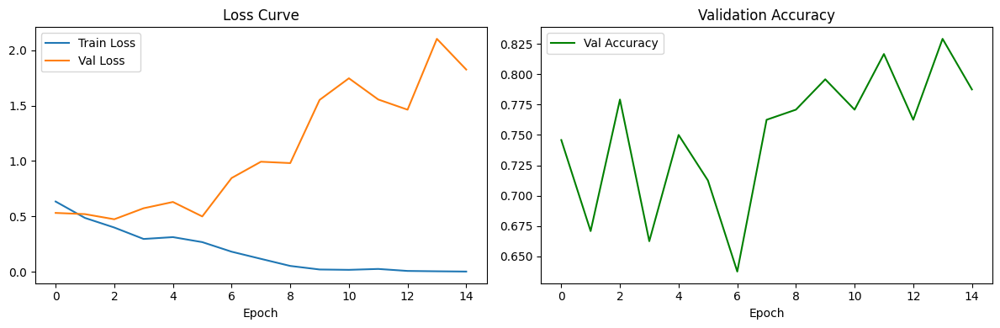

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Loss curve
axes[0].plot(train_losses, label='Train Loss')
axes[0].plot(val_losses, label='Val Loss')
axes[0].set_title('Loss Curve')
axes[0].set_xlabel('Epoch')
axes[0].legend()

# Validation accuracy
axes[1].plot(val_accs, color='green', label='Val Accuracy')
axes[1].set_title('Validation Accuracy')
axes[1].set_xlabel('Epoch')
axes[1].legend()

plt.tight_layout()
plt.show()

Evaluating checkpoint: /content/best_vgg16_reproduced.pth
Loaded best reproduced VGG16 checkpoint.
Classification Report — VGG16
                  precision    recall  f1-score   support

No Billboard (0)       0.87      0.86      0.87       218
   Billboard (1)       0.64      0.66      0.65        82

        accuracy                           0.81       300
       macro avg       0.76      0.76      0.76       300
    weighted avg       0.81      0.81      0.81       300



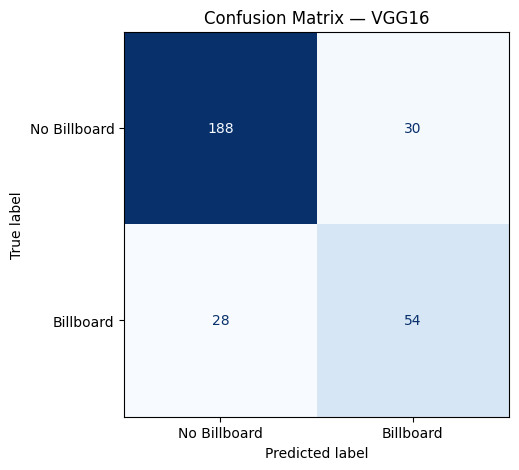

In [ ]:
## 10. Evaluation — VGG16

print(f'Evaluating checkpoint: {REPRODUCED_MODEL_PATH}')
model.eval()
print('Loaded best reproduced VGG16 checkpoint.')

all_preds, all_labels = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        preds = outputs.argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.numpy())

print('=' * 50)
print('Classification Report — VGG16')
print('=' * 50)
print(classification_report(
    all_labels, all_preds,
    target_names=['No Billboard (0)', 'Billboard (1)']
))

cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(cm, display_labels=['No Billboard', 'Billboard'])
fig, ax = plt.subplots(figsize=(5, 5))
disp.plot(ax=ax, cmap='Blues', colorbar=False)
ax.set_title('Confusion Matrix — VGG16')
plt.savefig('confusion_matrix_vgg16.png', dpi=150)
plt.show()

Ground truth positive rate: 0.273
Predicted positive rate:    0.280


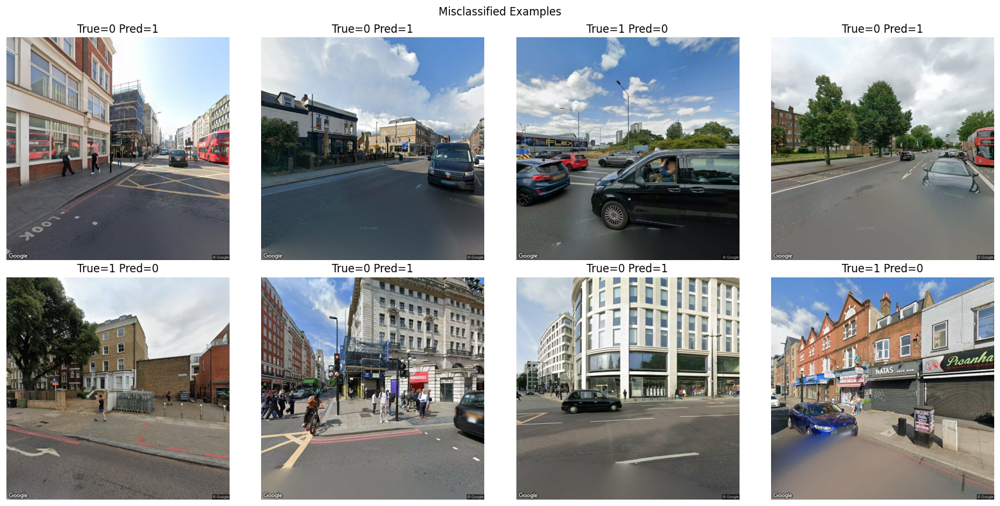

In [ ]:
# Sanity check
gt_pos_rate = test_df['label'].mean()
pred_pos_rate = (np.array(all_preds) == 1).mean()
print(f'Ground truth positive rate: {gt_pos_rate:.3f}')
print(f'Predicted positive rate:    {pred_pos_rate:.3f}')

# Show misclassified examples
mis_idx = [i for i, (p, l) in enumerate(zip(all_preds, all_labels)) if p != l]
sample_mis = random.sample(mis_idx, min(8, len(mis_idx)))

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for ax, idx in zip(axes.flat, sample_mis):
    row = test_df.iloc[idx]
    img = Image.open(os.path.join(IMG_DIR, row['filename'])).convert('RGB')
    ax.imshow(img)
    ax.set_title(f'True={all_labels[idx]} Pred={all_preds[idx]}')
    ax.axis('off')
plt.suptitle('Misclassified Examples')
plt.tight_layout()
plt.show()

### ViT

For the ViT model, we used the official pretrained **Vision Transformer base model** from Hugging Face: `google/vit-base-patch16-224`.

For this experiment, we used the same **training, validation, and test split** as in the other models. During training, the model was trained on the training set in each epoch and then evaluated on the validation set. The training loss, validation loss, and validation accuracy were recorded across epochs, and the checkpoint with the highest validation accuracy was saved as the best model.

After training was complete, the best-performing checkpoint was reloaded and evaluated on the independent test set.

In [ ]:
#!pip install transformers -q

In [ ]:
from transformers import AutoImageProcessor, ViTForImageClassification
from torchvision import transforms
import torch
import torch.nn as nn
import torch.optim as optim
import random
import numpy as np

In [ ]:
# Reset seeds before ViT training
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
torch.cuda.manual_seed(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
print('Seeds reset for ViT.')

Seeds reset for ViT.


In [ ]:
MODEL_NAME = "google/vit-base-patch16-224-in21k"

processor = AutoImageProcessor.from_pretrained(MODEL_NAME)

img_size = processor.size["height"] if "height" in processor.size else 224
vit_mean = processor.image_mean
vit_std = processor.image_std

print("img_size:", img_size)
print("mean:", vit_mean)
print("std:", vit_std)

model = ViTForImageClassification.from_pretrained(
    MODEL_NAME,
    num_labels=2,
    ignore_mismatched_sizes=True
)

model = model.to(device)
print(f"Model running on: {device}")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


img_size: 224
mean: [0.5, 0.5, 0.5]
std: [0.5, 0.5, 0.5]


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/198 [00:00<?, ?it/s]

ViTForImageClassification LOAD REPORT from: google/vit-base-patch16-224-in21k
Key                 | Status     | 
--------------------+------------+-
pooler.dense.bias   | UNEXPECTED | 
pooler.dense.weight | UNEXPECTED | 
classifier.bias     | MISSING    | 
classifier.weight   | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Model running on: cuda


In [ ]:
# Define Transforms
train_transforms = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=vit_mean, std=vit_std),
])

test_transforms = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=vit_mean, std=vit_std),
])

In [ ]:
# Rebuild Dataset and DataLoader
train_dataset = BillboardDataset(train_df, IMG_DIR, transform=train_transforms)
val_dataset   = BillboardDataset(val_df,   IMG_DIR, transform=test_transforms)
test_dataset  = BillboardDataset(test_df,  IMG_DIR, transform=test_transforms)

g = torch.Generator()
g.manual_seed(42)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,
    worker_init_fn=seed_worker,
    generator=g
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    worker_init_fn=seed_worker,
    generator=g
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    worker_init_fn=seed_worker,
    generator=g
)

print(f"Train: {len(train_dataset)} imgs, {len(train_loader)} batches")
print(f"Val:   {len(val_dataset)} imgs, {len(val_loader)} batches")
print(f"Test:  {len(test_dataset)} imgs, {len(test_loader)} batches")

Train: 960 imgs, 30 batches
Val:   240 imgs, 8 batches
Test:  300 imgs, 10 batches


In [ ]:
# Handle Class Imbalance
n_neg = (train_df["label"] == 0).sum()
n_pos = (train_df["label"] == 1).sum()

weight_for_pos = n_neg / n_pos
class_weights = torch.tensor([1.0, weight_for_pos], dtype=torch.float).to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.5)

print(f"Negative class weight: 1.00")
print(f"Positive class weight: {weight_for_pos:.2f}")

Negative class weight: 1.00
Positive class weight: 2.93


In [ ]:
# Training Loop — ViT
train_losses, val_losses, val_accs = [], [], []
best_val_acc = 0.0
best_model_path = "/content/best_vit.pth"

for epoch in range(NUM_EPOCHS):
    # Training
    model.train()
    running_loss = 0.0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(pixel_values=images)
        loss = criterion(outputs.logits, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    avg_train_loss = running_loss / len(train_loader)

    # Train Accuracy
    model.eval()
    train_correct, train_total = 0, 0

    with torch.no_grad():
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(pixel_values=images)
            preds = outputs.logits.argmax(dim=1)
            train_correct += (preds == labels).sum().item()
            train_total += labels.size(0)

    train_acc = train_correct / train_total

    # Validation
    val_correct, val_total, val_loss = 0, 0, 0.0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(pixel_values=images)
            val_loss += criterion(outputs.logits, labels).item()
            preds = outputs.logits.argmax(dim=1)
            val_correct += (preds == labels).sum().item()
            val_total += labels.size(0)

    avg_val_loss = val_loss / len(val_loader)
    val_acc = val_correct / val_total

    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)
    val_accs.append(val_acc)

    scheduler.step(avg_val_loss)

    # Save best model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), best_model_path)
        print(f"  -> Best model saved (Val Acc: {val_acc*100:.1f}%)")

    print(f"Epoch {epoch+1}")
    print("-------------------------------")
    print(f"Train set: Accuracy: {train_acc*100:.1f}%  Avg loss: {avg_train_loss:.4f}")
    print(f"Val set:   Accuracy: {val_acc*100:.1f}%  Avg loss: {avg_val_loss:.4f}")
    print()

print("Training complete!")
best_epoch = val_accs.index(best_val_acc) + 1
print(f"Best epoch: {best_epoch} / {NUM_EPOCHS}")
print(f"Best Val Accuracy: {best_val_acc*100:.1f}%")

# Load best model selected by validation
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.eval()
print(f"Best model loaded from: {best_model_path}")

  -> Best model saved (Val Acc: 75.0%)
Epoch 1
-------------------------------
Train set: Accuracy: 82.6%  Avg loss: 0.5762
Val set:   Accuracy: 75.0%  Avg loss: 0.4891

  -> Best model saved (Val Acc: 79.2%)
Epoch 2
-------------------------------
Train set: Accuracy: 95.3%  Avg loss: 0.3585
Val set:   Accuracy: 79.2%  Avg loss: 0.5204

Epoch 3
-------------------------------
Train set: Accuracy: 97.5%  Avg loss: 0.1686
Val set:   Accuracy: 78.8%  Avg loss: 0.6048

Epoch 4
-------------------------------
Train set: Accuracy: 98.1%  Avg loss: 0.1356
Val set:   Accuracy: 77.9%  Avg loss: 0.9337

Epoch 5
-------------------------------
Train set: Accuracy: 98.4%  Avg loss: 0.0844
Val set:   Accuracy: 75.8%  Avg loss: 0.6939

  -> Best model saved (Val Acc: 80.4%)
Epoch 6
-------------------------------
Train set: Accuracy: 99.7%  Avg loss: 0.0410
Val set:   Accuracy: 80.4%  Avg loss: 0.8379

Epoch 7
-------------------------------
Train set: Accuracy: 99.0%  Avg loss: 0.0267
Val set:   A

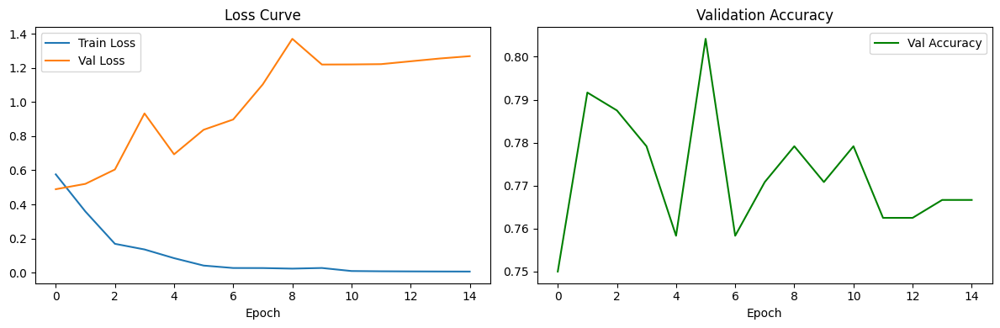

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Loss curve
axes[0].plot(train_losses, label='Train Loss')
axes[0].plot(val_losses, label='Val Loss')
axes[0].set_title('Loss Curve')
axes[0].set_xlabel('Epoch')
axes[0].legend()

# Validation accuracy
axes[1].plot(val_accs, color='green', label='Val Accuracy')
axes[1].set_title('Validation Accuracy')
axes[1].set_xlabel('Epoch')
axes[1].legend()

plt.tight_layout()
plt.show()

Loaded best ViT checkpoint.
Best epoch (based on validation): 6
Best validation accuracy: 80.4%
Test accuracy: 79.3%
Classification Report — ViT (Test Set)
                  precision    recall  f1-score   support

No Billboard (0)       0.86      0.85      0.86       218
   Billboard (1)       0.62      0.63      0.63        82

        accuracy                           0.79       300
       macro avg       0.74      0.74      0.74       300
    weighted avg       0.79      0.79      0.79       300



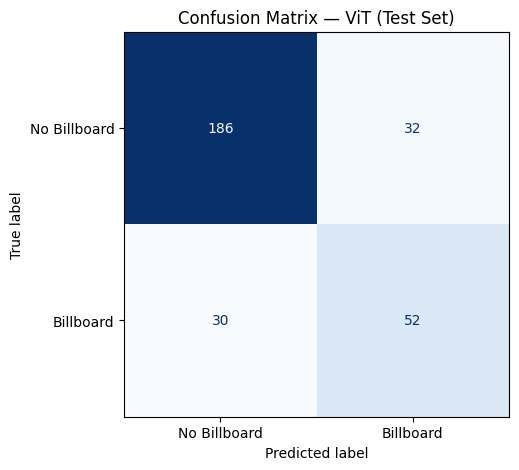

In [ ]:
## 10. Evaluation — ViT

# Load best model selected by validation
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.eval()
print('Loaded best ViT checkpoint.')

best_epoch = val_accs.index(max(val_accs)) + 1   # 1-based
best_val_acc = max(val_accs)

all_preds, all_labels = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(pixel_values=images)
        preds = outputs.logits.argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.cpu().numpy())

test_acc = (np.array(all_preds) == np.array(all_labels)).mean()

print('=' * 50)
print(f'Best epoch (based on validation): {best_epoch}')
print(f'Best validation accuracy: {best_val_acc*100:.1f}%')
print(f'Test accuracy: {test_acc*100:.1f}%')
print('=' * 50)
print('Classification Report — ViT (Test Set)')
print('=' * 50)
print(classification_report(
    all_labels, all_preds,
    target_names=['No Billboard (0)', 'Billboard (1)']
))

cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(cm, display_labels=['No Billboard', 'Billboard'])
fig, ax = plt.subplots(figsize=(5, 5))
disp.plot(ax=ax, cmap='Blues', colorbar=False)
ax.set_title('Confusion Matrix — ViT (Test Set)')
plt.savefig('confusion_matrix_vit.png', dpi=150)
plt.show()

Ground truth positive rate: 0.273
Predicted positive rate:    0.280


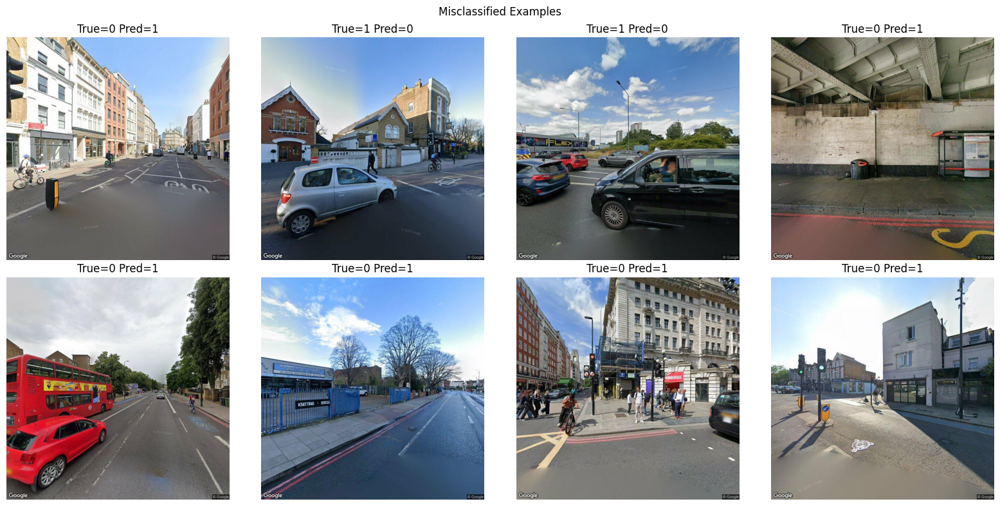

In [ ]:
# sanity check
gt_pos_rate = test_df['label'].mean()
pred_pos_rate = (np.array(all_preds) == 1).mean()
print(f'Ground truth positive rate: {gt_pos_rate:.3f}')
print(f'Predicted positive rate:    {pred_pos_rate:.3f}')

# Show misclassified examples
mis_idx = [i for i, (p, l) in enumerate(zip(all_preds, all_labels)) if p != l]
sample_mis = random.sample(mis_idx, min(8, len(mis_idx)))

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for ax, idx in zip(axes.flat, sample_mis):
    row = test_df.iloc[idx]
    img = Image.open(os.path.join(IMG_DIR, row['filename'])).convert('RGB')
    ax.imshow(img)
    ax.set_title(f'True={all_labels[idx]} Pred={all_preds[idx]}')
    ax.axis('off')
plt.suptitle('Misclassified Examples')
plt.tight_layout()
plt.show()

### Final Model Selection

Among the three models, **reproduced VGG16** achieved the strongest performance on the test set across all key metrics:

| Model | Test Accuracy | Billboard Recall | Billboard F1 |
|---|---|---|---|
| ResNet18 | 0.80 | 0.44 | 0.55 |
| **VGG16** | **0.81** | **0.66** | **0.65** |
| ViT | 0.79 | 0.63 | 0.63 |

VGG16 produced both the highest overall accuracy (`0.81`) and the highest sensitivity to the positive class (`Billboard` recall `0.66`, F1 `0.65`), meaning it identified billboard-containing images more reliably than either ResNet18 or ViT while also maintaining the most balanced overall predictions.

A second consideration in the final choice was reproducibility. ViT training on CUDA is not bit-exactly reproducible across runs, even with fixed random seeds, due to non-deterministic backward kernels in attention operations. Two independent training runs of our ViT pipeline with identical seeds yielded `Billboard` recall values of `0.79` and `0.63` respectively, indicating substantial run-to-run variability. By contrast, VGG16 produced identical metrics across re-runs from the same checkpoint, providing a more stable basis for downstream spatial analysis.

For these reasons, **VGG16** was selected as the final model for full-dataset prediction.


In [ ]:
#paths for final prediction
from pathlib import Path
import pandas as pd

CONTENT_ROOT = Path("/content")

FULL_LOG_CSV = CONTENT_ROOT / "download_log.csv"
FULL_IMG_DIR_PATH = CONTENT_ROOT / "New_Images_outdoor_full" / "New_Images_outdoor_full"
BEST_VGG16_PATH = CONTENT_ROOT / "best_vgg16_reproduced.pth"
IMAGE_PREDICTIONS_CSV = CONTENT_ROOT / "vgg16_full_predictions.csv"

print("FULL_LOG_CSV:", FULL_LOG_CSV, FULL_LOG_CSV.exists())
print("FULL_IMG_DIR_PATH:", FULL_IMG_DIR_PATH, FULL_IMG_DIR_PATH.exists())
print("BEST_VGG16_PATH:", BEST_VGG16_PATH, BEST_VGG16_PATH.exists())
print("IMAGE_PREDICTIONS_CSV:", IMAGE_PREDICTIONS_CSV)


FULL_LOG_CSV: /content/download_log.csv True
FULL_IMG_DIR_PATH: /content/New_Images_outdoor_full/New_Images_outdoor_full True
BEST_VGG16_PATH: /content/best_vgg16_reproduced.pth True
IMAGE_PREDICTIONS_CSV: /content/vgg16_full_predictions.csv


In [ ]:
#load best VGG16 and rebuild prediction transforms
from torchvision.models import vgg16, VGG16_Weights
from torchvision import transforms
import torch
import torch.nn as nn

# ImageNet statistics — VGG16 was fine-tuned from ImageNet pretraining
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

# Rebuild the VGG16 architecture (binary classification head),
# then load the saved fine-tuned weights.
model = vgg16(weights=VGG16_Weights.DEFAULT)
model.classifier[6] = nn.Linear(4096, 2)

state_dict = torch.load(BEST_VGG16_PATH, map_location=device, weights_only=True)
model.load_state_dict(state_dict)

model = model.to(device)
model.eval()

print("Best VGG16 loaded for final prediction.")
print("Final layer:", model.classifier[6])
print("Image size: 224, mean:", IMAGENET_MEAN, "std:", IMAGENET_STD)


Best VGG16 loaded for final prediction.
Final layer: Linear(in_features=4096, out_features=2, bias=True)
Image size: 224, mean: [0.485, 0.456, 0.406] std: [0.229, 0.224, 0.225]


In [ ]:
#build full prediction dataset
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader

full_df = pd.read_csv(FULL_LOG_CSV)
print(full_df.head())
print(full_df.columns.tolist())
print("Rows in full log:", len(full_df))

filename_col = "image_name"
assert filename_col in full_df.columns, f"'{filename_col}' column not found in download_log.csv"

class FullPredictionDataset(Dataset):
    def __init__(self, dataframe, img_dir, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.img_dir = str(img_dir)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        filename = row[filename_col]
        img_path = os.path.join(self.img_dir, filename)
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image, filename

# keep only rows whose image file actually exists
full_df["img_exists"] = full_df[filename_col].apply(lambda x: (FULL_IMG_DIR_PATH / x).exists())
missing_count = (~full_df["img_exists"]).sum()

print("Missing image files:", missing_count)

full_df = full_df[full_df["img_exists"]].drop(columns=["img_exists"]).reset_index(drop=True)
print("Rows used for prediction:", len(full_df))

full_dataset = FullPredictionDataset(full_df, FULL_IMG_DIR_PATH, transform=test_transforms)
full_loader = DataLoader(
    full_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0
)

print(f"Full dataset: {len(full_dataset)} imgs, {len(full_loader)} batches")

  point_id       lon        lat  heading        image_name      status  \
0  pt_0001 -0.253866  51.437102        0    pt_0001_h0.jpg  downloaded   
1  pt_0001 -0.253866  51.437102       90   pt_0001_h90.jpg  downloaded   
2  pt_0001 -0.253866  51.437102      180  pt_0001_h180.jpg  downloaded   
3  pt_0001 -0.253866  51.437102      270  pt_0001_h270.jpg  downloaded   
4  pt_0002 -0.252628  51.437560        0    pt_0002_h0.jpg  downloaded   

   used_radius  
0         10.0  
1         10.0  
2         10.0  
3         10.0  
4         10.0  
['point_id', 'lon', 'lat', 'heading', 'image_name', 'status', 'used_radius']
Rows in full log: 10660
Missing image files: 24
Rows used for prediction: 10636
Full dataset: 10636 imgs, 333 batches


Sample point_id: pt_0279
     point_id  heading        image_name
1112  pt_0279        0    pt_0279_h0.jpg
1113  pt_0279       90   pt_0279_h90.jpg
1114  pt_0279      180  pt_0279_h180.jpg
1115  pt_0279      270  pt_0279_h270.jpg


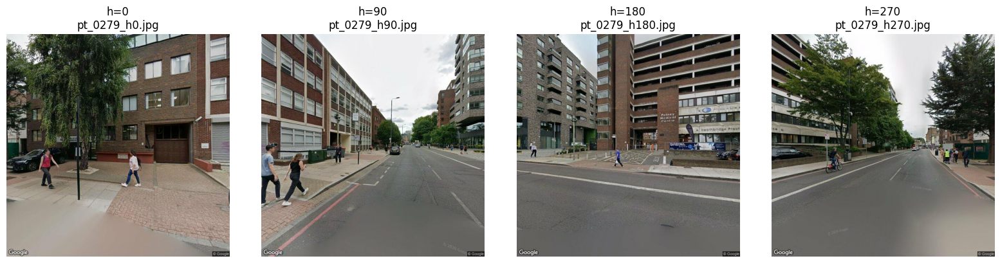

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# check one point
sample_point_id = full_df["point_id"].sample(1, random_state=42).iloc[0]
sample_point_df = full_df[full_df["point_id"] == sample_point_id].sort_values("heading")

print("Sample point_id:", sample_point_id)
print(sample_point_df[["point_id", "heading", "image_name"]])

n = len(sample_point_df)
plt.figure(figsize=(4 * n, 4))

for i, (_, row) in enumerate(sample_point_df.iterrows(), 1):
    img_path = os.path.join(str(FULL_IMG_DIR_PATH), row["image_name"])
    img = Image.open(img_path).convert("RGB")

    plt.subplot(1, n, i)
    plt.imshow(img)
    plt.title(f'h={row["heading"]}\n{row["image_name"]}')
    plt.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
# run full prediction and save CSV

all_filenames = []
all_preds = []
all_probs = []

with torch.no_grad():
    for images, filenames in full_loader:
        images = images.to(device)

        logits = model(images)
        probs = torch.softmax(logits, dim=1)[:, 1].cpu().numpy()
        preds = logits.argmax(dim=1).cpu().numpy()

        all_filenames.extend(list(filenames))
        all_preds.extend(preds.tolist())
        all_probs.extend(probs.tolist())

pred_df = full_df.copy()
pred_df["vgg16_pred"] = all_preds
pred_df["vgg16_prob_billboard"] = all_probs

pred_df.to_csv(IMAGE_PREDICTIONS_CSV, index=False)

print("Saved full prediction CSV to:", IMAGE_PREDICTIONS_CSV)
print(pred_df.head())
print(pred_df["vgg16_pred"].value_counts(dropna=False))
print("Predicted positive rate:", pred_df["vgg16_pred"].mean())


Saved full prediction CSV to: /content/vgg16_full_predictions.csv
  point_id       lon        lat  heading        image_name      status  \
0  pt_0001 -0.253866  51.437102        0    pt_0001_h0.jpg  downloaded   
1  pt_0001 -0.253866  51.437102       90   pt_0001_h90.jpg  downloaded   
2  pt_0001 -0.253866  51.437102      180  pt_0001_h180.jpg  downloaded   
3  pt_0001 -0.253866  51.437102      270  pt_0001_h270.jpg  downloaded   
4  pt_0002 -0.252628  51.437560        0    pt_0002_h0.jpg  downloaded   

   used_radius  vgg16_pred  vgg16_prob_billboard  
0         10.0           0          1.515756e-08  
1         10.0           0          1.149495e-07  
2         10.0           0          9.292762e-09  
3         10.0           0          2.919353e-04  
4         10.0           0          3.653208e-05  
vgg16_pred
0    8179
1    2457
Name: count, dtype: int64
Predicted positive rate: 0.23100789770590446


# Check results

In [ ]:
print(pred_df["vgg16_prob_billboard"].describe())

count    1.063600e+04
mean     2.319313e-01
std      4.006602e-01
min      3.981269e-20
25%      1.162047e-06
50%      7.739395e-05
75%      2.443264e-01
max      1.000000e+00
Name: vgg16_prob_billboard, dtype: float64


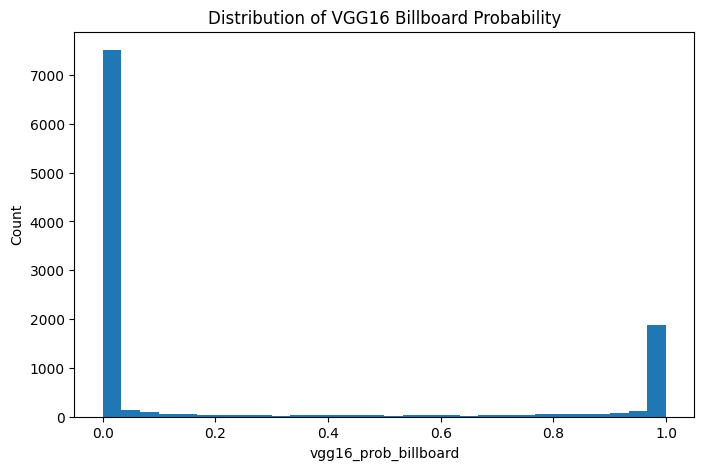

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.hist(pred_df["vgg16_prob_billboard"], bins=30)
plt.xlabel("vgg16_prob_billboard")
plt.ylabel("Count")
plt.title("Distribution of VGG16 Billboard Probability")
plt.show()


# A probability threshold of 0.5 was used to classify billboard presence (`1`) versus absence (`0`).

In [ ]:
pred_df["vgg16_pred_05"] = (pred_df["vgg16_prob_billboard"] >= 0.5).astype(int)
print(pred_df["vgg16_pred_05"].value_counts())
print("Predicted positive rate:", pred_df["vgg16_pred_05"].mean())

vgg16_pred_05
0    8179
1    2457
Name: count, dtype: int64
Predicted positive rate: 0.23100789770590446


# Aggregate image-level predictions to point level

In [ ]:
POINT_EXPOSURE_CSV = "/content/vgg16_point_exposure.csv"

point_exposure = (
    pred_df.groupby("point_id")
    .agg(
        lon=("lon", "first"),
        lat=("lat", "first"),
        n_views=("vgg16_pred", "size"),
        n_billboard=("vgg16_pred", "sum"),
        mean_prob_billboard=("vgg16_prob_billboard", "mean"),
        max_prob_billboard=("vgg16_prob_billboard", "max")
    )
    .reset_index()
)

point_exposure["exposure_ratio"] = (
    point_exposure["n_billboard"] / point_exposure["n_views"]
)

point_exposure.to_csv(POINT_EXPOSURE_CSV, index=False)

print("Saved point exposure CSV to:", POINT_EXPOSURE_CSV)
print(point_exposure.head())
print("Number of points:", len(point_exposure))
print(point_exposure["n_views"].value_counts().sort_index())


Saved point exposure CSV to: /content/vgg16_point_exposure.csv
  point_id       lon        lat  n_views  n_billboard  mean_prob_billboard  \
0  pt_0001 -0.253866  51.437102        4            0             0.000073   
1  pt_0002 -0.252628  51.437560        4            0             0.000010   
2  pt_0003 -0.251390  51.438018        4            1             0.247793   
3  pt_0004 -0.250139  51.438461        4            0             0.000003   
4  pt_0005 -0.248893  51.438911        4            0             0.000177   

   max_prob_billboard  exposure_ratio  
0            0.000292            0.00  
1            0.000037            0.00  
2            0.990993            0.25  
3            0.000012            0.00  
4            0.000625            0.00  
Number of points: 2659
n_views
4    2659
Name: count, dtype: int64


In [ ]:
print(point_exposure["n_views"].describe())
print("Points with 4 views:", (point_exposure["n_views"] == 4).sum())
print("Points with <4 views:", (point_exposure["n_views"] < 4).sum())


count    2659.0
mean        4.0
std         0.0
min         4.0
25%         4.0
50%         4.0
75%         4.0
max         4.0
Name: n_views, dtype: float64
Points with 4 views: 2659
Points with <4 views: 0


# calculate the proportion of exposure per IMD Decile

In [ ]:
# Run once if geopandas is missing in your environment.
!pip install geopandas

In [ ]:
import geopandas as gpd
# read point exposure csv
df = pd.read_csv("/content/vgg16_point_exposure.csv")

# make point GeoDataFrame
gdf_points = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df["lon"], df["lat"]),
    crs="EPSG:4326"
)

# read IMD shapefile
gdf_imd = gpd.read_file('/content/IMD/IMD/Study_area_IMD.shp')

# unify CRS
if gdf_points.crs != gdf_imd.crs:
    gdf_points = gdf_points.to_crs(gdf_imd.crs)

# spatial join
joined = gpd.sjoin(gdf_points, gdf_imd, how="left", predicate="within")

print(joined.head())
print(joined.columns.tolist())
print("Rows:", len(joined))

  point_id       lon        lat  n_views  n_billboard  mean_prob_billboard  \
0  pt_0001 -0.253866  51.437102        4            0             0.000073   
1  pt_0002 -0.252628  51.437560        4            0             0.000010   
2  pt_0003 -0.251390  51.438018        4            1             0.247793   
3  pt_0004 -0.250139  51.438461        4            0             0.000003   
4  pt_0005 -0.248893  51.438911        4            0             0.000177   

   max_prob_billboard  exposure_ratio                       geometry  \
0            0.000292            0.00  POINT (521466.701 172346.426)   
1            0.000037            0.00  POINT (521551.545 172399.357)   
2            0.990993            0.25  POINT (521636.378 172452.306)   
3            0.000012            0.00  POINT (521722.149 172503.721)   
4            0.000625            0.00  POINT (521807.533 172555.768)   

   index_right  ...   LSOA11CD         LSOA11NM IMD_RANK  IMD_DECILE  \
0        603.0  ...  E0100

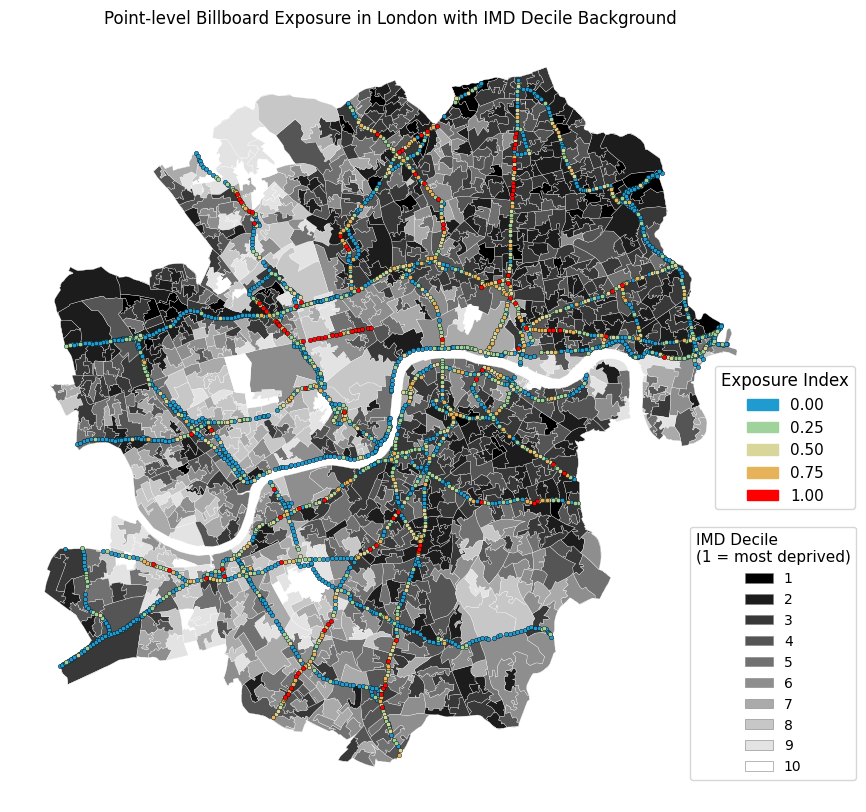

In [ ]:
# Brief Visualisation here, later we will improve the mapping using QGIS
fig, ax = plt.subplots(figsize=(10, 10))
import matplotlib.patches as mpatches
import matplotlib.cm as cm
from matplotlib.colors import Normalize

# make sure exposure values are clean discrete levels
joined_plot = joined.copy()
joined_plot["exposure_plot"] = joined_plot["exposure_ratio"].round(2)

# custom point colours
color_map = {
    0.00: "#1f9bcf",   # blue
    0.25: "#9fd39b",   # green
    0.50: "#d9d69c",   # pale yellow-green
    0.75: "#e7b35a",   # orange
    1.00: "#ff0000"    # red
}

levels = [0.00, 0.25, 0.50, 0.75, 1.00]

# background polygons coloured by IMD decile
# (1 = most deprived = black, 10 = least deprived = white)
gdf_imd.plot(
    ax=ax,
    column="IMD_DECILE",
    cmap="gray",
    vmin=1,
    vmax=10,
    edgecolor="white",
    linewidth=0.2,
)

# plot each exposure level separately, with a thin black edge
# so lighter-coloured markers stay visible on light (least-deprived) areas
for level in levels:
    subset = joined_plot[joined_plot["exposure_plot"] == level]
    if len(subset) > 0:
        subset.plot(
            ax=ax,
            color=color_map[level],
            markersize=10,
            edgecolor="black",
            linewidth=0.3,
        )

# Legend 1: Exposure Index (points)
exposure_handles = [
    mpatches.Patch(color=color_map[level], label=f"{level:.2f}")
    for level in levels
]
leg1 = ax.legend(
    handles=exposure_handles,
    title="Exposure Index",
    loc="lower right",
    bbox_to_anchor=(1.12, 0.37),
    frameon=True,
    fontsize=11,
    title_fontsize=12,
)
ax.add_artist(leg1)  # keep first legend when we add the second

# Legend 2: IMD Decile (polygon background)
imd_norm = Normalize(vmin=1, vmax=10)
imd_handles = [
    mpatches.Patch(
        facecolor=cm.gray(imd_norm(d)),
        edgecolor="grey",
        linewidth=0.4,
        label=str(d),
    )
    for d in range(1, 11)
]
ax.legend(
    handles=imd_handles,
    title="IMD Decile\n(1 = most deprived)",
    loc="lower right",
    bbox_to_anchor=(1.12, 0.02),
    frameon=True,
    fontsize=10,
    title_fontsize=11,
)

ax.set_title("Point-level Billboard Exposure in London with IMD Decile Background")
ax.set_axis_off()
plt.show()

In [ ]:
# Now calculate the exposure in each IMD Decile
imd_col = "IMD_DECILE"
exposure_col = "exposure_ratio"

# drop rows with missing IMD decile or exposure
joined_valid = joined.dropna(subset=[imd_col, exposure_col]).copy()

# convert IMD decile to integer
joined_valid[imd_col] = pd.to_numeric(joined_valid[imd_col], errors="coerce")
joined_valid = joined_valid.dropna(subset=[imd_col])
joined_valid[imd_col] = joined_valid[imd_col].astype(int)

# convert exposure_ratio to discrete exposure classes
joined_valid["exposure_index"] = (joined_valid[exposure_col] * 4).round() / 4

# contingency table: rows = IMD decile, columns = exposure level
imd_exposure_table = pd.crosstab(
    joined_valid[imd_col],
    joined_valid["exposure_index"]
)

# standardize within each decile
imd_exposure_prop = imd_exposure_table.div(imd_exposure_table.sum(axis=1), axis=0)

# ensure all exposure levels appear
imd_exposure_prop = imd_exposure_prop.reindex(
    columns=[0.00, 0.25, 0.50, 0.75, 1.00],
    fill_value=0
)

# ensure all IMD deciles 1–10 appear
imd_exposure_prop = imd_exposure_prop.reindex(range(1, 11), fill_value=0)

print(imd_exposure_prop)
print(imd_exposure_prop.sum(axis=1))

exposure_index      0.00      0.25      0.50      0.75      1.00
IMD_DECILE                                                      
1               0.626506  0.192771  0.096386  0.084337  0.000000
2               0.472767  0.235294  0.143791  0.104575  0.043573
3               0.494444  0.225926  0.174074  0.068519  0.037037
4               0.471831  0.218310  0.150235  0.103286  0.056338
5               0.496622  0.229730  0.162162  0.070946  0.040541
6               0.537764  0.214502  0.120846  0.060423  0.066465
7               0.485000  0.265000  0.125000  0.095000  0.030000
8               0.533981  0.223301  0.116505  0.072816  0.053398
9               0.686869  0.242424  0.030303  0.010101  0.030303
10              0.764706  0.235294  0.000000  0.000000  0.000000
IMD_DECILE
1     1.0
2     1.0
3     1.0
4     1.0
5     1.0
6     1.0
7     1.0
8     1.0
9     1.0
10    1.0
dtype: float64


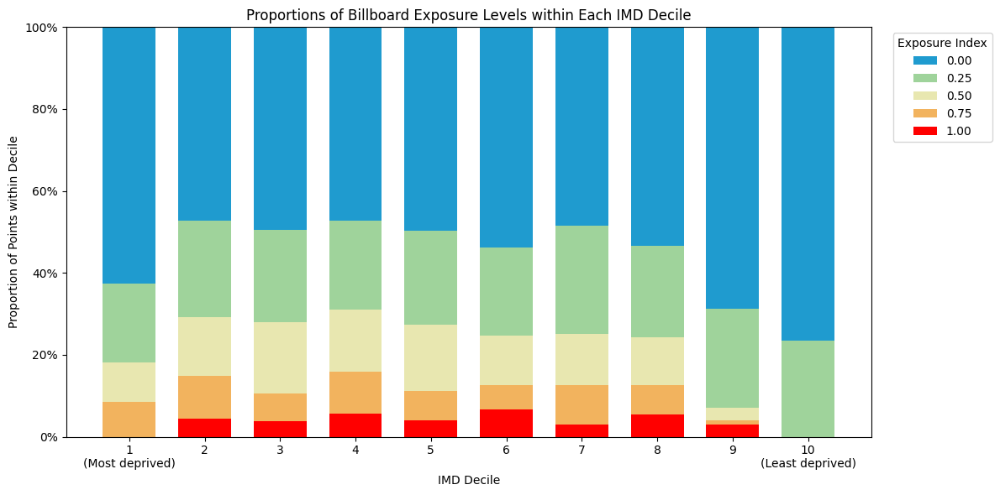

In [ ]:
import matplotlib.ticker as mtick

imd_exposure_prop = imd_exposure_prop.sort_index()

x = np.arange(len(imd_exposure_prop.index))

# high exposure at the bottom reverse=True
exposure_levels = sorted(imd_exposure_prop.columns.tolist(), reverse=True)

color_map = {
    0.00: '#1f9bcf',
    0.25: '#9fd39b',
    0.50: '#e8e7b0',
    0.75: '#f2b35e',
    1.00: '#ff0000'
}

fig, ax = plt.subplots(figsize=(12, 6))

bottom = np.zeros(len(imd_exposure_prop))

for level in exposure_levels:
    values = imd_exposure_prop[level].values
    ax.bar(
        x,
        values,
        bottom=bottom,
        width=0.7,
        label=f'{level:.2f}',
        color=color_map.get(level, 'gray')
    )
    bottom += values

ax.set_xlabel('IMD Decile')
ax.set_ylabel('Proportion of Points within Decile')
ax.set_title('Proportions of Billboard Exposure Levels within Each IMD Decile')

ax.set_xticks(x)
ax.set_xticklabels([
    '1\n(Most deprived)', '2', '3', '4', '5',
    '6', '7', '8', '9', '10\n(Least deprived)'
])

ax.set_ylim(0, 1)
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))

# invert the legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(
    handles[::-1], labels[::-1],
    title='Exposure Index',
    bbox_to_anchor=(1.02, 1),
    loc='upper left'
)

plt.tight_layout()
#plt.savefig('imd_exposure_stacked_bar_100.png',dpi=300,bbox_inches='tight')
plt.show()

# Now we are going to improve the visualisation of data on QGIS, with IMD INDEX, please check the QGIS file with step-by-step reproduction